In [4]:
import pandas as pd

outfit_data = pd.read_csv('datathon/dataset/outfit_data.csv')
product_data = pd.read_csv('datathon/dataset/product_data.csv')
outfit_data

,cod_outfit,cod_modelo_color
0,1,51000622-02
1,1,43067759-01
2,1,53060518-02
3,1,53030594-08
4,1,43077762-01
...,...,...
43577,7497,47082514-95
43578,7497,57041183-06
43579,7497,57074425-08
43580,7373,57089203-99


In [17]:
files_by_cat = product_data[['des_product_category', 'des_filename']].groupby('des_product_category').agg(lambda x: list(x))['des_filename']

In [20]:
files_by_cat

des_product_category
Accesories, Swim and Intimate          [datathon/images/2019_57007891_05.jpg, datatho...
Beauty                                 [datathon/images/2023_57023275_98.jpg, datatho...
Bottoms                                [datathon/images/2019_41085800_02.jpg, datatho...
Dresses, jumpsuits and Complete set    [datathon/images/2019_53030601_81.jpg, datatho...
Home                                   [datathon/images/2023_47042516_08.jpg, datatho...
Outerwear                              [datathon/images/2023_57067753_TO.jpg, datatho...
Tops                                   [datathon/images/2019_53070773_70.jpg, datatho...
Name: des_filename, dtype: object

In [19]:
files_by_cat['Accesories, Swim and Intimate']

['datathon/images/2019_57007891_05.jpg',
 'datathon/images/2023_47086303_08.jpg',
 'datathon/images/2023_57040032_32.jpg',
 'datathon/images/2023_57040164_99.jpg',
 'datathon/images/2023_57020260_83.jpg',
 'datathon/images/2023_57084018_99.jpg',
 'datathon/images/2023_57004787_07.jpg',
 'datathon/images/2019_43031153_99.jpg',
 'datathon/images/2019_53070567_02.jpg',
 'datathon/images/2019_53060575_52.jpg',
 'datathon/images/2019_53050579_99.jpg',
 'datathon/images/2019_57057700_99.jpg',
 'datathon/images/2023_47091297_99.jpg',
 'datathon/images/2023_57090027_99.jpg',
 'datathon/images/2023_57002518_99.jpg',
 'datathon/images/2023_47028651_99.jpg',
 'datathon/images/2023_57092003_CU.jpg',
 'datathon/images/2023_57054422_08.jpg',
 'datathon/images/2023_57057740_99.jpg',
 'datathon/images/2019_53030594_08.jpg',
 'datathon/images/2019_53090804_99.jpg',
 'datathon/images/2019_53013754_PL.jpg',
 'datathon/images/2022_37010684_CU.jpg',
 'datathon/images/2023_47037825_CU.jpg',
 'datathon/image

In [5]:
product_data['des_product_category'].value_counts()

des_product_category
Tops                                   2768
Accesories, Swim and Intimate          2633
Bottoms                                1631
Dresses, jumpsuits and Complete set    1374
Outerwear                               725
Home                                     61
Beauty                                   30
Name: count, dtype: int64

Outfit ID: 1


NameError: name 'Image' is not defined

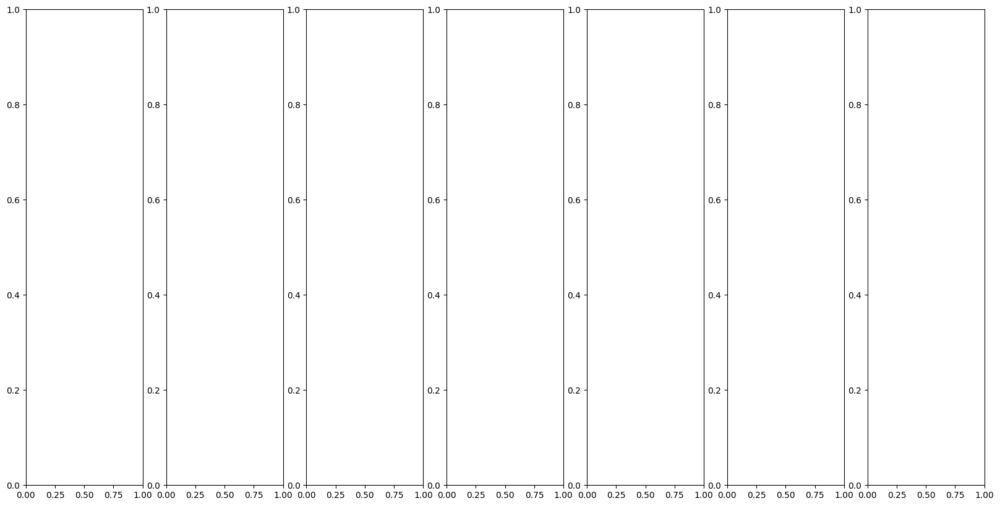

In [171]:
import matplotlib.pyplot as plt

def plot_all_outfit_images(outfit_data, product_data):
    unique_outfits = outfit_data['cod_outfit'].unique()
    i = 0

    for outfit_id in unique_outfits:
        if i < 20:
            i += 1
            # Filter the products that belong to the specified outfit
            outfit_products = outfit_data[outfit_data['cod_outfit'] == outfit_id]['cod_modelo_color']
            linked_products = product_data[product_data['cod_modelo_color'].isin(outfit_products)]

            # Plotting the images
            print(f"Outfit ID: {outfit_id}")
            fig, axes = plt.subplots(1, len(linked_products), figsize=(20, 10))
            if len(linked_products) == 1:  # Handle case for single product
                axes = [axes]
            for ax, (_, product) in zip(axes, linked_products.iterrows()):
                img_path = product['des_filename']
                try:
                    img = Image.open(img_path)
                    ax.imshow(img)
                    ax.set_title(product['cod_modelo_color'])
                    ax.axis('off')
                except FileNotFoundError:
                    ax.set_title("Image not found")
                    ax.axis('off')
            plt.tight_layout()
            plt.show()
        else:
            break

plot_all_outfit_images(outfit_data, product_data)

In [61]:
outfit_data['cod_outfit'].nunique()

7842

In [170]:
product_data[['des_product_category', 'des_line']].value_counts()

des_product_category                 des_line
Tops                                 SHE         2757
Accesories, Swim and Intimate        SHE         2626
Bottoms                              SHE         1629
Dresses, jumpsuits and Complete set  SHE         1366
Outerwear                            SHE          725
Home                                 HOME          50
Beauty                               SHE           30
Home                                 SHE           11
Tops                                 KIDS           9
Dresses, jumpsuits and Complete set  KIDS           8
Accesories, Swim and Intimate        VIOLETA        7
Bottoms                              KIDS           2
Tops                                 HE             2
Name: count, dtype: int64

In [117]:
product_data[['des_product_category', 'des_product_aggregated_family']].value_counts()

des_product_category                 des_product_aggregated_family
Accesories, Swim and Intimate        Accessories                      2466
Dresses, jumpsuits and Complete set  Dresses and jumpsuits            1374
Tops                                 Sweaters and Cardigans            880
                                     Shirts                            679
                                     T-shirts                          665
Bottoms                              Trousers & leggings               655
                                     Skirts and shorts                 632
Tops                                 Tops                              544
Outerwear                            Jackets and Blazers               418
Bottoms                              Jeans                             344
Outerwear                            Coats and Parkas                  307
Accesories, Swim and Intimate        Swim and intimate                 167
Beauty                           

In [41]:
product_data.head()

,cod_modelo_color,cod_color_code,des_color_specification_esp,des_agrup_color_eng,des_sex,des_age,des_line,des_fabric,des_product_category,des_product_aggregated_family,des_product_family,des_product_type,des_filename
0,41085800-02,02,OFFWHITE,WHITE,Female,Adult,SHE,P-PLANA,Bottoms,Trousers & leggings,Trousers,Trousers,datathon/images/2019_41085800_02.jpg
1,53000586-TO,TO,TEJANO OSCURO,BLUE,Female,Adult,SHE,J-JEANS,Bottoms,Jeans,Jeans,Jeans,datathon/images/2019_53000586_TO.jpg
2,53030601-81,81,ROSA PASTEL,PINK,Female,Adult,SHE,P-PLANA,"Dresses, jumpsuits and Complete set",Dresses and jumpsuits,Dresses,Dress,datathon/images/2019_53030601_81.jpg
3,53050730-15,15,MOSTAZA,YELLOW,Female,Adult,SHE,P-PLANA,"Dresses, jumpsuits and Complete set",Dresses and jumpsuits,Dresses,Dress,datathon/images/2019_53050730_15.jpg
4,53070773-70,70,ROJO,RED,Female,Adult,SHE,P-PLANA,Tops,Shirts,Shirt,Shirt,datathon/images/2019_53070773_70.jpg


In [43]:
outfit_data.shape

(43582, 2)

In [121]:
from collections import Counter

outfits = pd.merge(outfit_data, product_data, on='cod_modelo_color').sort_values('cod_outfit').groupby('cod_outfit').apply(lambda x: Counter(x['des_product_category'])).to_frame()

In [ ]:
def plot_outfit()

In [166]:
outfits

,0,size
cod_outfit,,
1,"{'Tops': 1, 'Accesories, Swim and Intimate': 5...",7
2,"{'Accesories, Swim and Intimate': 3, 'Bottoms'...",5
3,"{'Accesories, Swim and Intimate': 6, 'Bottoms'...",8
4,"{'Accesories, Swim and Intimate': 8, 'Bottoms'...",10
5,"{'Accesories, Swim and Intimate': 9, 'Tops': 1...",11
...,...,...
7838,"{'Home': 5, 'Accesories, Swim and Intimate': 2}",7
7839,"{'Accesories, Swim and Intimate': 2, 'Home': 5}",7
7840,"{'Tops': 1, 'Accesories, Swim and Intimate': 3...",5


In [122]:
outfits

,0
cod_outfit,
1,"{'Tops': 1, 'Accesories, Swim and Intimate': 5..."
2,"{'Accesories, Swim and Intimate': 3, 'Bottoms'..."
3,"{'Accesories, Swim and Intimate': 6, 'Bottoms'..."
4,"{'Accesories, Swim and Intimate': 8, 'Bottoms'..."
5,"{'Accesories, Swim and Intimate': 9, 'Tops': 1..."
...,...
7838,"{'Home': 5, 'Accesories, Swim and Intimate': 2}"
7839,"{'Accesories, Swim and Intimate': 2, 'Home': 5}"
7840,"{'Tops': 1, 'Accesories, Swim and Intimate': 3..."


In [123]:
outfits['size'] = pd.merge(outfit_data, product_data, on='cod_modelo_color').sort_values('cod_outfit').groupby('cod_outfit').size()
outfits

,0,size
cod_outfit,,
1,"{'Tops': 1, 'Accesories, Swim and Intimate': 5...",7
2,"{'Accesories, Swim and Intimate': 3, 'Bottoms'...",5
3,"{'Accesories, Swim and Intimate': 6, 'Bottoms'...",8
4,"{'Accesories, Swim and Intimate': 8, 'Bottoms'...",10
5,"{'Accesories, Swim and Intimate': 9, 'Tops': 1...",11
...,...,...
7838,"{'Home': 5, 'Accesories, Swim and Intimate': 2}",7
7839,"{'Accesories, Swim and Intimate': 2, 'Home': 5}",7
7840,"{'Tops': 1, 'Accesories, Swim and Intimate': 3...",5


In [165]:
outfits[outfits[0].str['Dresses, jumpsuits and Complete set'] > 0]

,0,size
cod_outfit,,
13,"{'Accesories, Swim and Intimate': 5, 'Dresses,...",6
14,"{'Accesories, Swim and Intimate': 8, 'Tops': 1...",10
15,"{'Dresses, jumpsuits and Complete set': 1, 'Ac...",5
20,"{'Accesories, Swim and Intimate': 7, 'Dresses,...",8
21,"{'Dresses, jumpsuits and Complete set': 1, 'Ac...",7
...,...,...
7832,"{'Accesories, Swim and Intimate': 5, 'Dresses,...",6
7836,"{'Accesories, Swim and Intimate': 3, 'Dresses,...",4
7837,"{'Accesories, Swim and Intimate': 3, 'Dresses,...",4


In [156]:


for outfit in outfits.iterrows():
    print(outfit)
    break

(1, 0       {'Tops': 1, 'Accesories, Swim and Intimate': 5...
size                                                    7
Name: 1, dtype: object)


In [150]:
outfits[outfits[0].str['Dresses, jumpsuits and Complete set'].notna()]

,0,size
cod_outfit,,
13,"{'Accesories, Swim and Intimate': 5, 'Dresses,...",6
14,"{'Accesories, Swim and Intimate': 8, 'Tops': 1...",10
15,"{'Dresses, jumpsuits and Complete set': 1, 'Ac...",5
20,"{'Accesories, Swim and Intimate': 7, 'Dresses,...",8
21,"{'Dresses, jumpsuits and Complete set': 1, 'Ac...",7
...,...,...
7832,"{'Accesories, Swim and Intimate': 5, 'Dresses,...",6
7836,"{'Accesories, Swim and Intimate': 3, 'Dresses,...",4
7837,"{'Accesories, Swim and Intimate': 3, 'Dresses,...",4


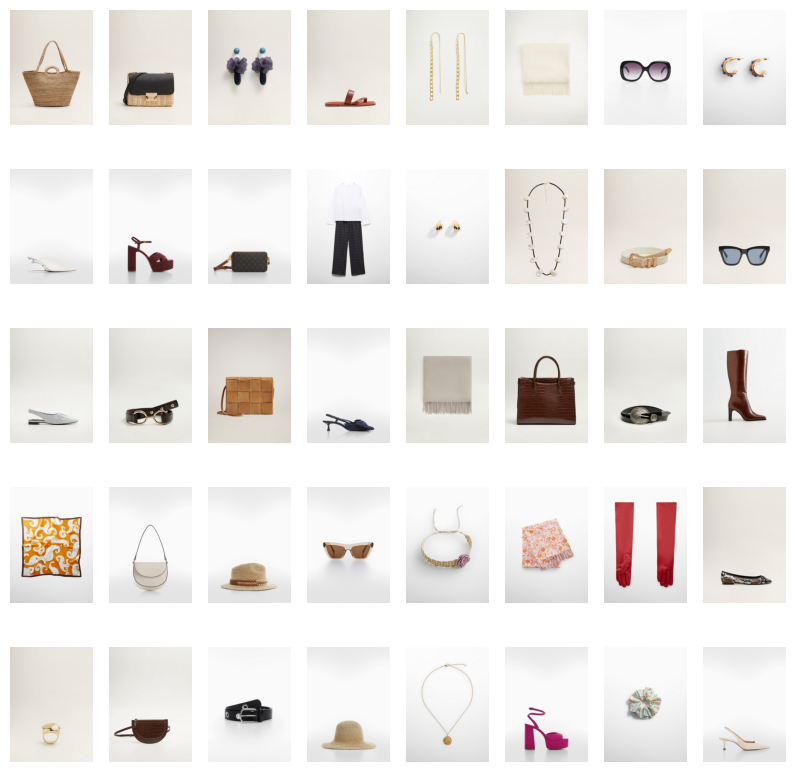

In [110]:
import matplotlib.pyplot as plt
import numpy as np

def plot_images(images, per_row=8):
    n_images = len(images)
    rows = int(np.ceil(n_images/per_row))
    fig = plt.figure(figsize=(10, 10))
    for i in range(rows):
        for j in range(per_row):
            idx = i*per_row + j
            if idx < n_images:
                img = plt.imread(images[idx])
                a = fig.add_subplot(rows, per_row, idx+1)
                plt.imshow(img)
                a.axis('off')
            else:
                plt.show()

plot_images(product_data[product_data['des_product_category']=='Accesories, Swim and Intimate']['des_filename'].iloc[80:120].to_list())

In [167]:
product_data[['des_product_category', 'des_product_aggregated_family']].value_counts()

des_product_category                 des_product_aggregated_family
Accesories, Swim and Intimate        Accessories                      2466
Dresses, jumpsuits and Complete set  Dresses and jumpsuits            1374
Tops                                 Sweaters and Cardigans            880
                                     Shirts                            679
                                     T-shirts                          665
Bottoms                              Trousers & leggings               655
                                     Skirts and shorts                 632
Tops                                 Tops                              544
Outerwear                            Jackets and Blazers               418
Bottoms                              Jeans                             344
Outerwear                            Coats and Parkas                  307
Accesories, Swim and Intimate        Swim and intimate                 167
Beauty                           

<Axes: xlabel='0', ylabel='Count'>

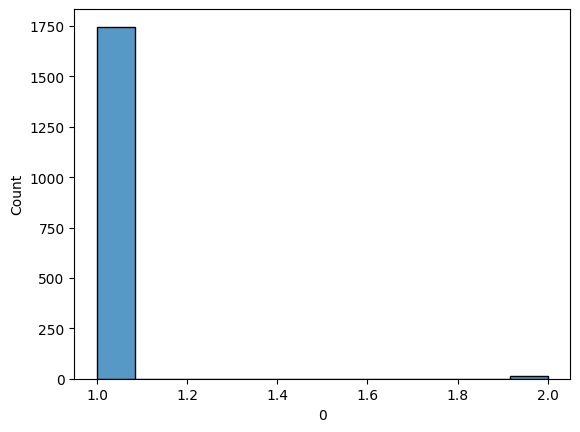

In [138]:
import seaborn as sns

sns.histplot(outfits[0].str['Dresses, jumpsuits and Complete set'])

In [46]:
outfits['size'].describe()

count    7842.000000
mean        5.557511
std         1.322626
min         2.000000
25%         5.000000
50%         5.000000
75%         6.000000
max        15.000000
Name: size, dtype: float64

In [14]:
df.str['Tops'].value_counts()

0
1.0    4648
2.0     701
3.0      70
4.0      12
5.0       1
Name: count, dtype: int64

In [38]:
outfits = outfit_data.groupby('cod_outfit').agg(lambda x: list(x))
outfits

,cod_modelo_color
cod_outfit,
1,"[51000622-02, 43067759-01, 53060518-02, 530305..."
2,"[53060518-02, 51000622-06, 41041002-02, 530605..."
3,"[43075794-OR, 43005802-OR, 51000622-70, 410788..."
4,"[43075794-OR, 43005802-OR, 43073737-OR, 430637..."
5,"[53060518-02, 43005802-OR, 43073737-OR, 430257..."
...,...
7838,"[57036014-30, 57077714-99, 57094411-30, 579660..."
7839,"[57036014-30, 57077714-99, 57094411-30, 570540..."
7840,"[53080809-OR, 51080862-99, 53053793-OR, 570067..."


In [37]:
outfits['cod_modelo_color']

cod_outfit
1       [51000622-02, 43067759-01, 53060518-02, 530305...
2       [53060518-02, 51000622-06, 41041002-02, 530605...
3       [43075794-OR, 43005802-OR, 51000622-70, 410788...
4       [43075794-OR, 43005802-OR, 43073737-OR, 430637...
5       [53060518-02, 43005802-OR, 43073737-OR, 430257...
                              ...                        
7838    [57036014-30, 57077714-99, 57094411-30, 579660...
7839    [57036014-30, 57077714-99, 57094411-30, 570540...
7840    [53080809-OR, 51080862-99, 53053793-OR, 570067...
7841    [53080809-OR, 53080716-OR, 53023750-99, 570359...
7842    [53080809-OR, 53080716-OR, 53023750-99, 570359...
Name: cod_modelo_color, Length: 7842, dtype: object

In [33]:
outfits.head()

,cod_modelo_color
cod_outfit,
1,"[51000622-02, 43067759-01, 53060518-02, 530305..."
2,"[53060518-02, 51000622-06, 41041002-02, 530605..."
3,"[43075794-OR, 43005802-OR, 51000622-70, 410788..."
4,"[43075794-OR, 43005802-OR, 43073737-OR, 430637..."
5,"[53060518-02, 43005802-OR, 43073737-OR, 430257..."


Outfit ID: 1


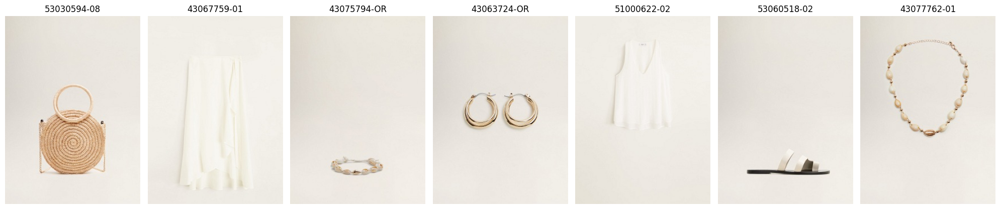

Outfit ID: 2086


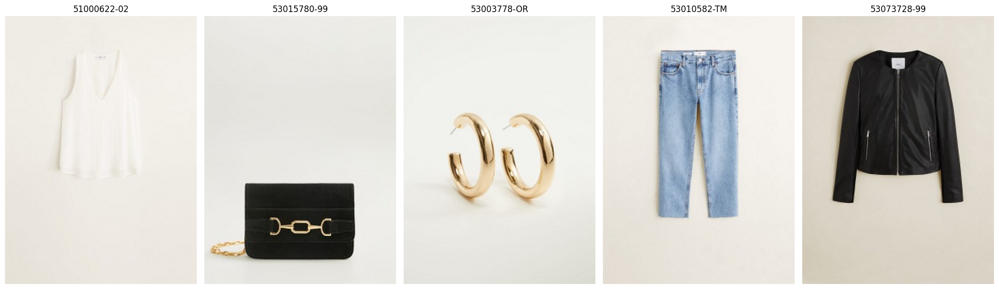

Outfit ID: 145


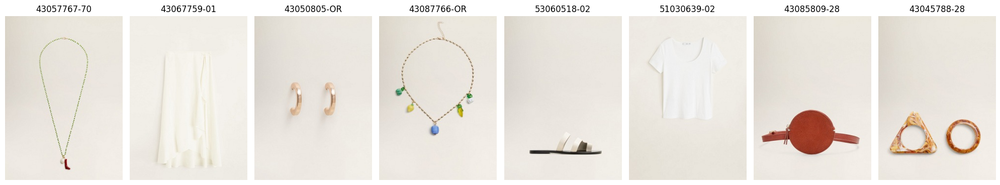

Outfit ID: 626


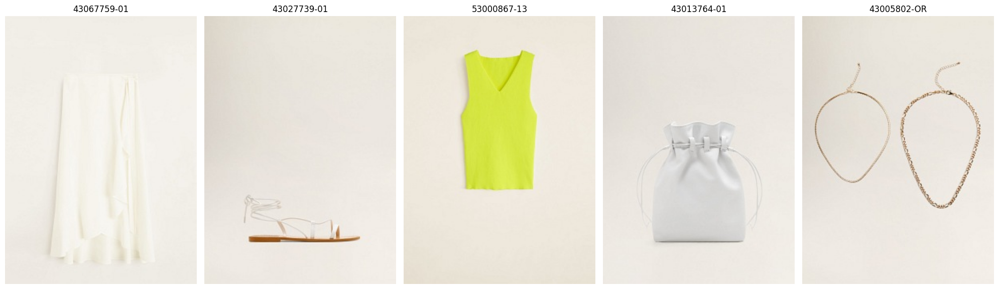

Outfit ID: 2


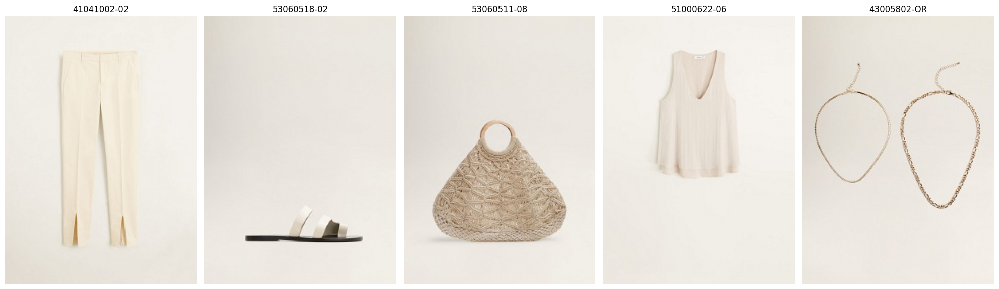

Outfit ID: 5


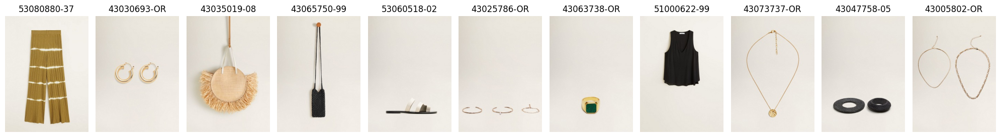

Outfit ID: 8


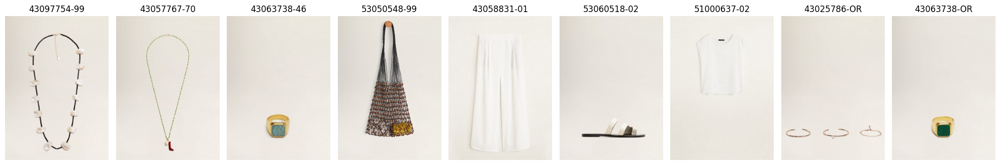

Outfit ID: 27


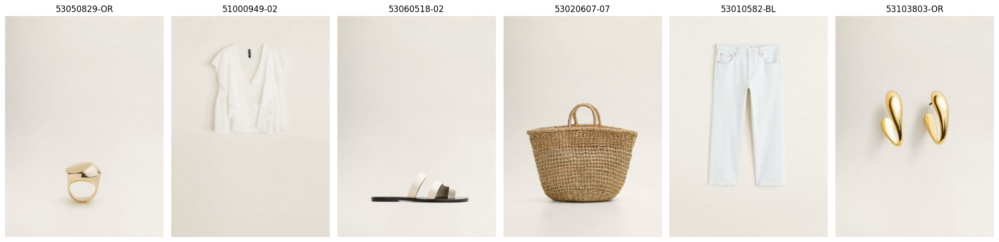

Outfit ID: 31


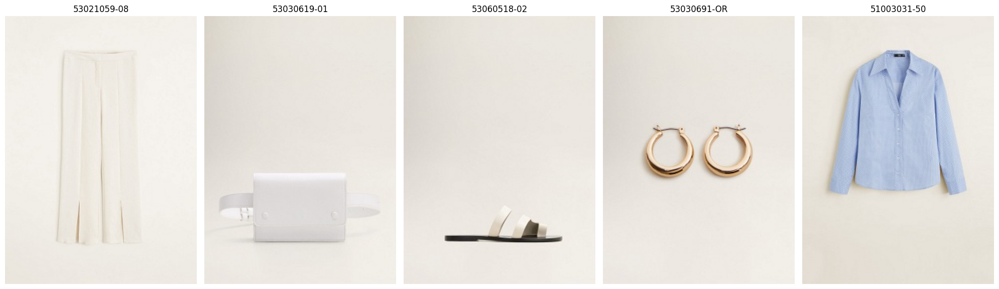

Outfit ID: 102


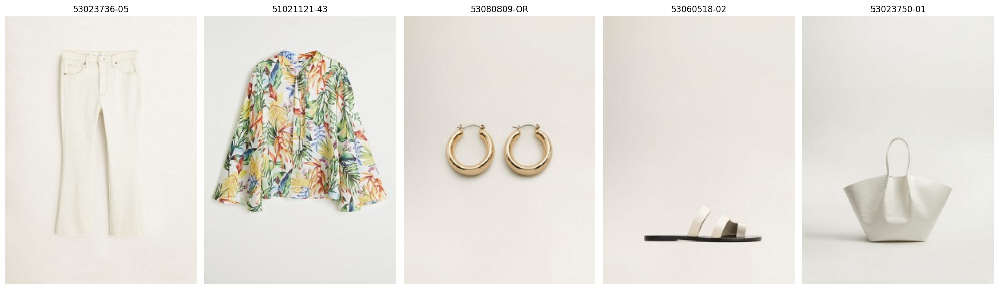

Outfit ID: 104


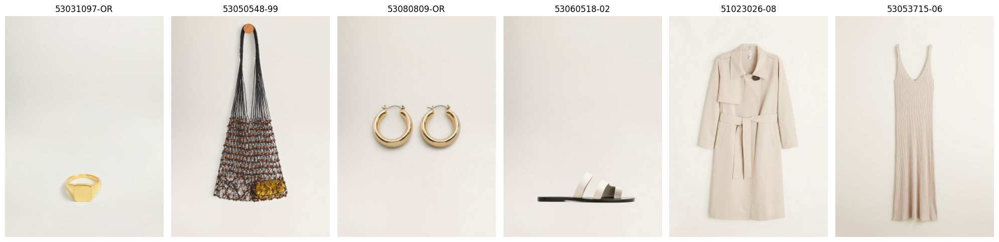

Outfit ID: 139


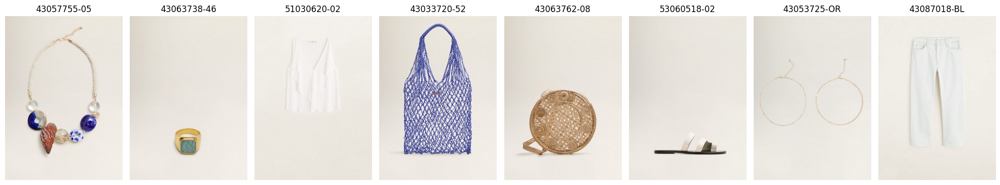

Outfit ID: 140


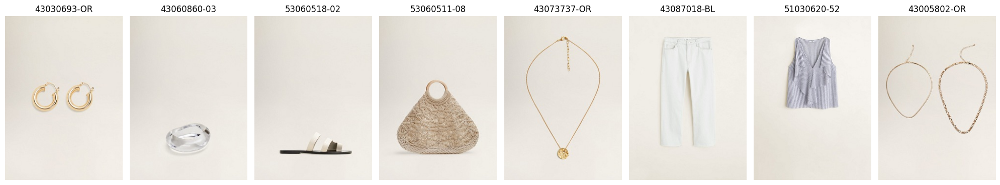

Outfit ID: 147


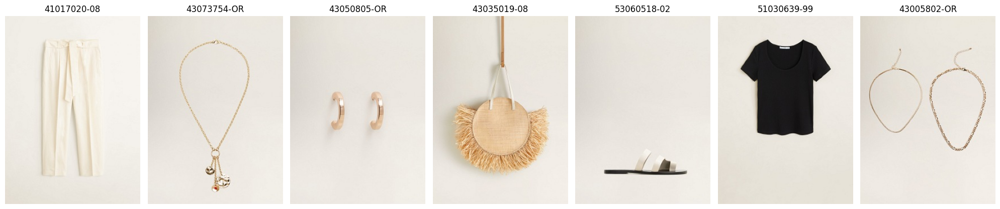

Outfit ID: 166


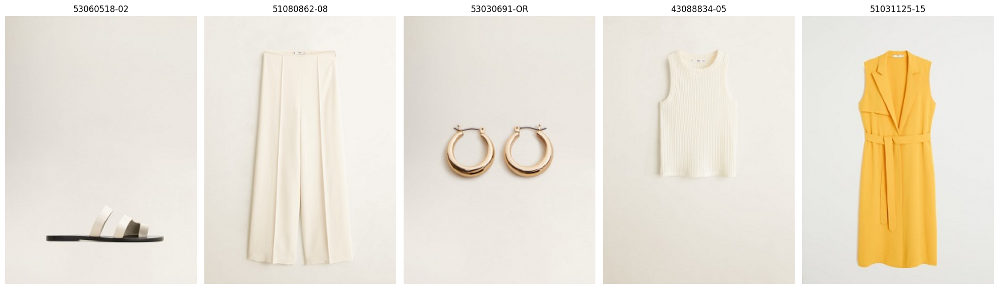

Outfit ID: 200


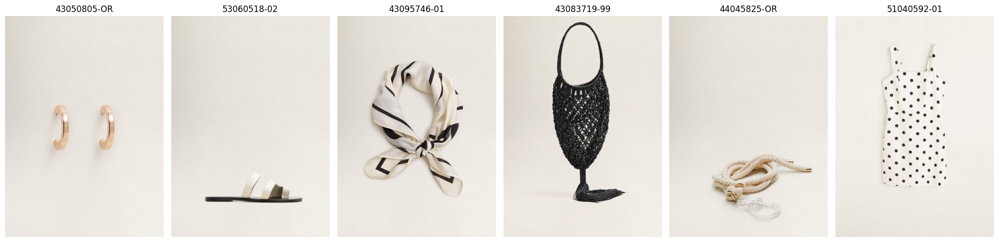

Outfit ID: 214


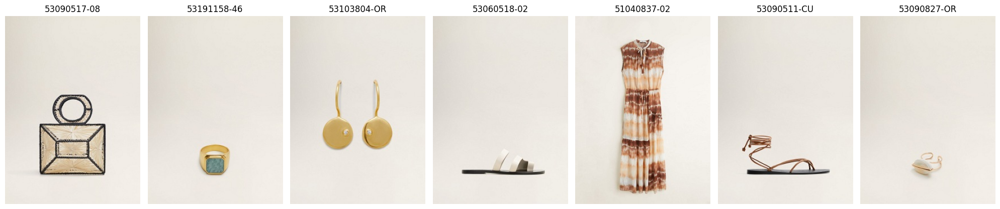

Outfit ID: 219


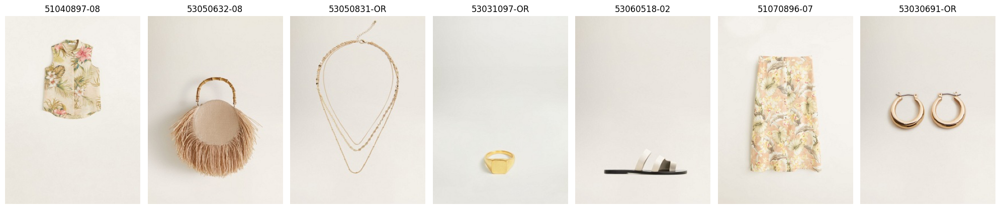

Outfit ID: 220


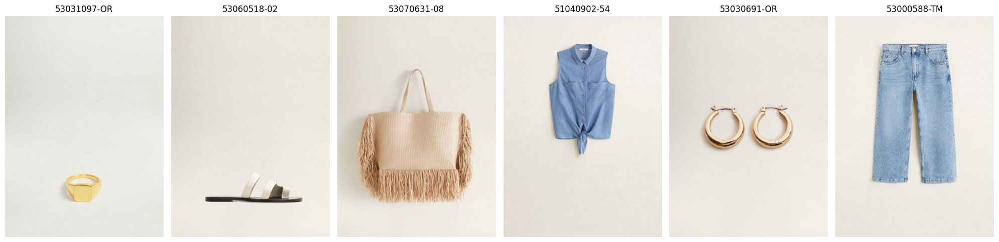

Outfit ID: 240


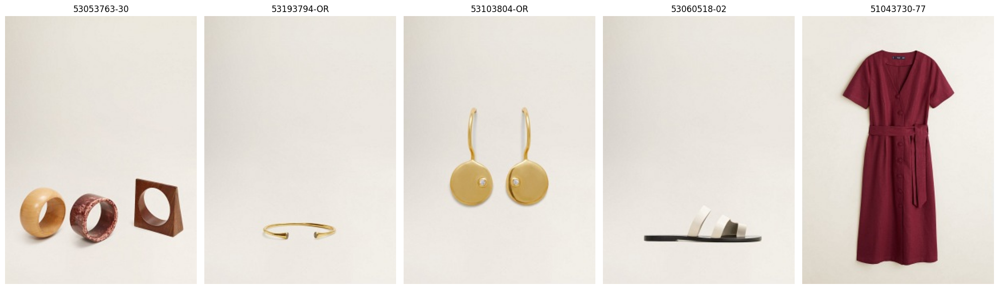

In [ ]:
import pandas as pd
from utils import plot_all_outfit_images

outfit_data = pd.read_csv('datathon/dataset/outfit_data.csv')
product_data = pd.read_csv('datathon/dataset/product_data.csv')


plot_all_outfit_images(outfit_data, product_data)
